# Introduction: Time Series Analysis of temperature data

In this notebook, historical weather data for Berlin Tempelhof are being analyzed. An AR(2) model is developed to predict the  and predicted using ARMA models.

## Import Python Packages

In [164]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc = {'figure.figsize':(15,8)})

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from statsmodels.api import OLS, add_constant, qqplot
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
from statsmodels.graphics.tsaplots import plot_pacf
import plotly.express as px

from sklearn.model_selection import TimeSeriesSplit, cross_val_score


## Import Dataset

In [165]:
# Read in the daily mean temperature dataset for Berlin-Tempelhof
# The dataset is downloaded from https://www.ecad.eu/dailydata/predefinedseries.php 

df_temp_mean = pd.read_csv('TG_STAID002759.txt' ,skiprows=19)
df_temp_mean.head(5)

,STAID,SOUID,DATE,TG,Q_TG
0,2759,27488,18760101,22,0
1,2759,27488,18760102,25,0
2,2759,27488,18760103,3,0
3,2759,27488,18760104,-58,0
4,2759,27488,18760105,-98,0


Column explanation provided by the dateset description:
- STAID: Station Identifier
- SOUD: Source Identifier
- DATE: Date YYYYMMDD
- TG: Mean Temperatur (-9999 for missing values)
- Q_TG: Quality Code for TG (0=valid, 1=suspect, 9=missing)

# Exploratory Data Analysis

## Dataset inspection

In [166]:
df_temp_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53599 entries, 0 to 53598
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   STAID     53599 non-null  int64
 1    SOUID    53599 non-null  int64
 2       DATE  53599 non-null  int64
 3      TG     53599 non-null  int64
 4    Q_TG     53599 non-null  int64
dtypes: int64(5)
memory usage: 2.0 MB


In [167]:
df_temp_mean.columns

Index(['STAID', ' SOUID', '    DATE', '   TG', ' Q_TG'], dtype='object')

In [168]:
df_temp_mean = df_temp_mean.rename(columns={'STAID': 'STAID', ' SOUID': 'SOUID', '    DATE':'DATE','   TG':'TG', ' Q_TG':'Q_TG'})

In [169]:
df_temp_mean.columns

Index(['STAID', 'SOUID', 'DATE', 'TG', 'Q_TG'], dtype='object')

## 'DATE' to datetime format

In [170]:
df_temp_mean['DATE'] = pd.to_datetime(df_temp_mean['DATE'], format='%Y%m%d')
df_temp_mean.head(5)

,STAID,SOUID,DATE,TG,Q_TG
0,2759,27488,1876-01-01,22,0
1,2759,27488,1876-01-02,25,0
2,2759,27488,1876-01-03,3,0
3,2759,27488,1876-01-04,-58,0
4,2759,27488,1876-01-05,-98,0


## Missing values inspection

According to the dataset description in line 6, missing values in the column TG are expressed by a value of -9999. 

<AxesSubplot: xlabel='DATE'>

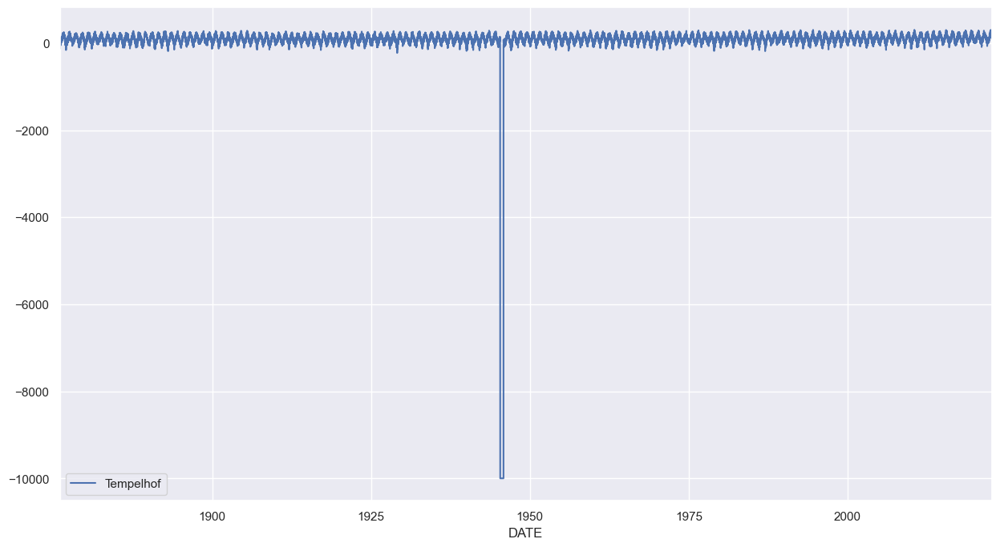

In [171]:
df_temp_mean.plot(x='DATE', y='TG', label = "Tempelhof")

In [172]:
df_temp_mean.loc[df_temp_mean['Q_TG'] == 9]

,STAID,SOUID,DATE,TG,Q_TG
25316,2759,27488,1945-04-25,-9999,9
25317,2759,27488,1945-04-26,-9999,9
25318,2759,27488,1945-04-27,-9999,9
25319,2759,27488,1945-04-28,-9999,9
25320,2759,27488,1945-04-29,-9999,9
...,...,...,...,...,...
25506,2759,27488,1945-11-01,-9999,9
25507,2759,27488,1945-11-02,-9999,9
25508,2759,27488,1945-11-03,-9999,9
25509,2759,27488,1945-11-04,-9999,9


## Deletion of data prior to 1946-11-06

In [173]:
df_temp_mean.iloc[25511]

STAID                   2759
SOUID                  27488
DATE     1945-11-06 00:00:00
TG                        78
Q_TG                       0
Name: 25511, dtype: object

In [174]:
df_temp_mean.head(5)

,STAID,SOUID,DATE,TG,Q_TG
0,2759,27488,1876-01-01,22,0
1,2759,27488,1876-01-02,25,0
2,2759,27488,1876-01-03,3,0
3,2759,27488,1876-01-04,-58,0
4,2759,27488,1876-01-05,-98,0


In [175]:
df_temp_mean= df_temp_mean.drop(df_temp_mean.index[range(25511)])

df_temp_mean.head(5)

,STAID,SOUID,DATE,TG,Q_TG
25511,2759,27488,1945-11-06,78,0
25512,2759,27488,1945-11-07,68,0
25513,2759,27488,1945-11-08,64,0
25514,2759,27488,1945-11-09,40,0
25515,2759,27488,1945-11-10,46,0


Text(0, 0.5, 'Average Temperature')

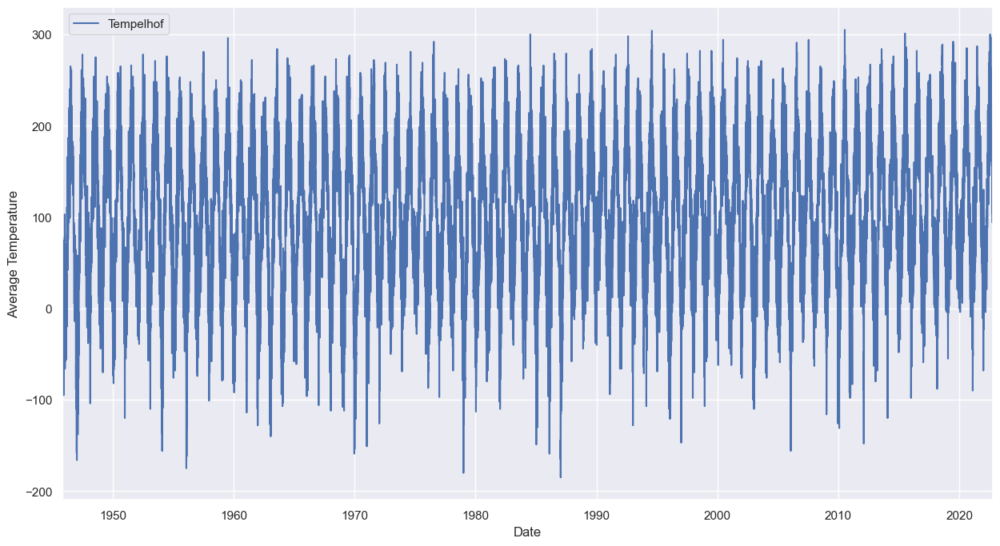

In [176]:
df_temp_mean.plot(x='DATE', y='TG', label = "Tempelhof")
plt.xlabel('Date')
plt.ylabel('Average Temperature')

In [ ]:
fig = px.line(df_temp_mean, x='DATE', y="TG", title="Daily temperature changes in Berlin-Tempelhof")

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="3y", step="year", stepmode="backward"),
            dict(count=3, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

# Feature engineering

Introduction of a 'timestamp' column as well as 'year' and 'month' column to model trend and seasonality of the time series in the subsequent chapter

In [177]:
df_temp_mean['Year'] = df_temp_mean['DATE'].dt.year
df_temp_mean['Month'] = df_temp_mean['DATE'].dt.month
df_temp_mean['Timestep'] = range(len(df_temp_mean))
df_temp_mean.head(5)

,STAID,SOUID,DATE,TG,Q_TG,Year,Month,Timestep
25511,2759,27488,1945-11-06,78,0,1945,11,0
25512,2759,27488,1945-11-07,68,0,1945,11,1
25513,2759,27488,1945-11-08,64,0,1945,11,2
25514,2759,27488,1945-11-09,40,0,1945,11,3
25515,2759,27488,1945-11-10,46,0,1945,11,4


In [178]:
df_temp_mean.set_index('DATE', inplace=True)
df_temp_mean.head(5)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep
DATE,,,,,,,
1945-11-06,2759,27488,78,0,1945,11,0
1945-11-07,2759,27488,68,0,1945,11,1
1945-11-08,2759,27488,64,0,1945,11,2
1945-11-09,2759,27488,40,0,1945,11,3
1945-11-10,2759,27488,46,0,1945,11,4


In [179]:
# One-hot-encode the month
seasonal_dummies_month = pd.get_dummies(df_temp_mean.index.month,
                                  prefix='Month',
                                  drop_first=True).set_index(df_temp_mean.index)

In [180]:
# join the dummies with the flights data frame
df_temp_mean = df_temp_mean.join(seasonal_dummies_month)
df_temp_mean.head(5)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
DATE,,,,,,,,,,,,,,,,,,
1945-11-06,2759,27488,78,0,1945,11,0,0,0,0,0,0,0,0,0,0,1,0
1945-11-07,2759,27488,68,0,1945,11,1,0,0,0,0,0,0,0,0,0,1,0
1945-11-08,2759,27488,64,0,1945,11,2,0,0,0,0,0,0,0,0,0,1,0
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,0,0,0,0,0,0,1,0
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,0,0,0,0,0,0,1,0


## Train Test Split

Take the final year as test data

In [183]:
df_train = df_temp_mean[:-365].copy()
df_test = df_temp_mean[-365:].copy()

In [184]:
X_train = df_train[['Timestep']] # matrix (or DataFrame)
y_train = df_train['TG'] # vector (or Series)

Text(0, 0.5, 'Temperature (Celsius)')

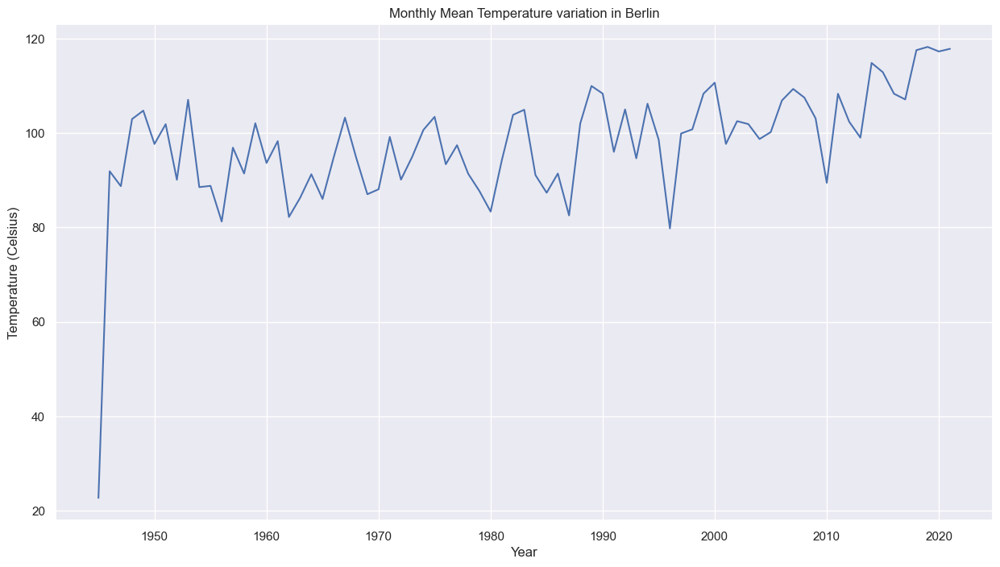

In [185]:
df_train.groupby('Year')['TG'].mean().plot()
plt.title('Monthly Mean Temperature variation in Berlin')
plt.ylabel('Temperature (Celsius)')

## Trend modelling

In [186]:
m_trend = LinearRegression()

In [187]:
m_trend.fit(X_train, y_train)

LinearRegression()

In [188]:
X_train.columns


Index(['Timestep'], dtype='object')

In [189]:
m_trend.score(X_train, y_train)

0.005029264384620702

In [190]:
df_train['trend'] = m_trend.predict(X_train)

In [191]:
df_train.head(5)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,trend
DATE,,,,,,,,,,,,,,,,,,,
1945-11-06,2759,27488,78,0,1945,11,0,0,0,0,0,0,0,0,0,0,1,0,88.704943
1945-11-07,2759,27488,68,0,1945,11,1,0,0,0,0,0,0,0,0,0,1,0,88.705646
1945-11-08,2759,27488,64,0,1945,11,2,0,0,0,0,0,0,0,0,0,1,0,88.706349
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,0,0,0,0,0,0,1,0,88.707052
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,0,0,0,0,0,0,1,0,88.707755


<AxesSubplot: xlabel='DATE'>

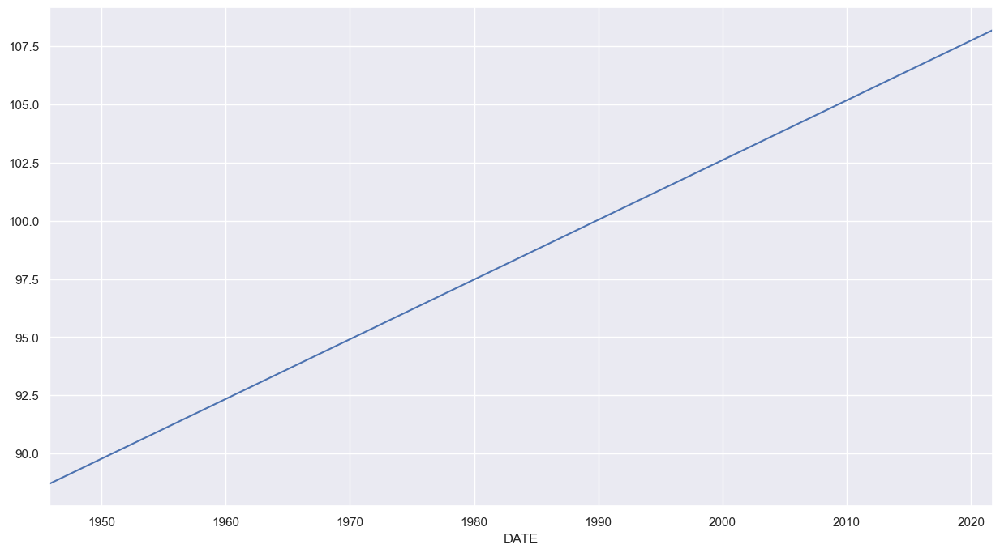

In [193]:
df_train['trend'].plot()

<AxesSubplot: xlabel='DATE'>

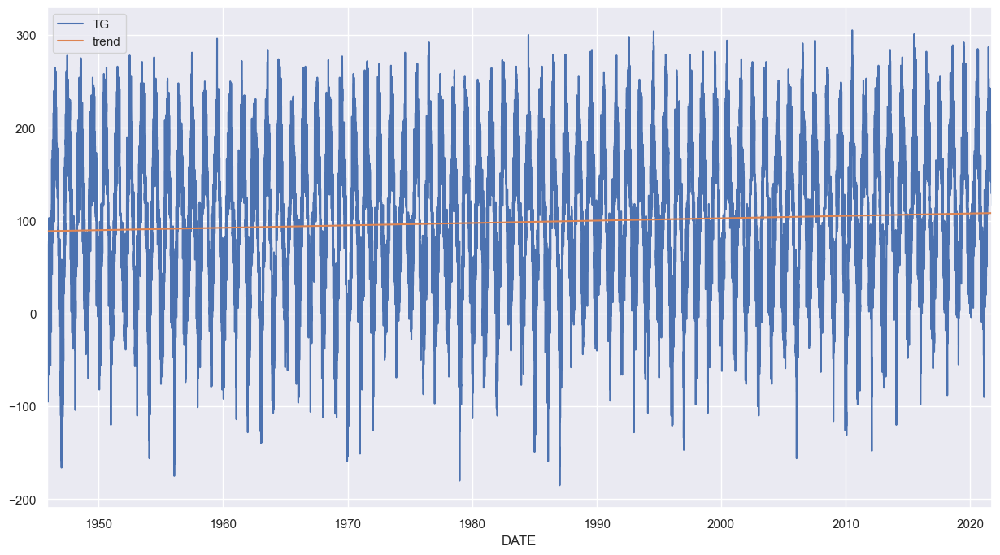

In [194]:
df_train[['TG','trend']].plot()


<AxesSubplot: xlabel='DATE'>

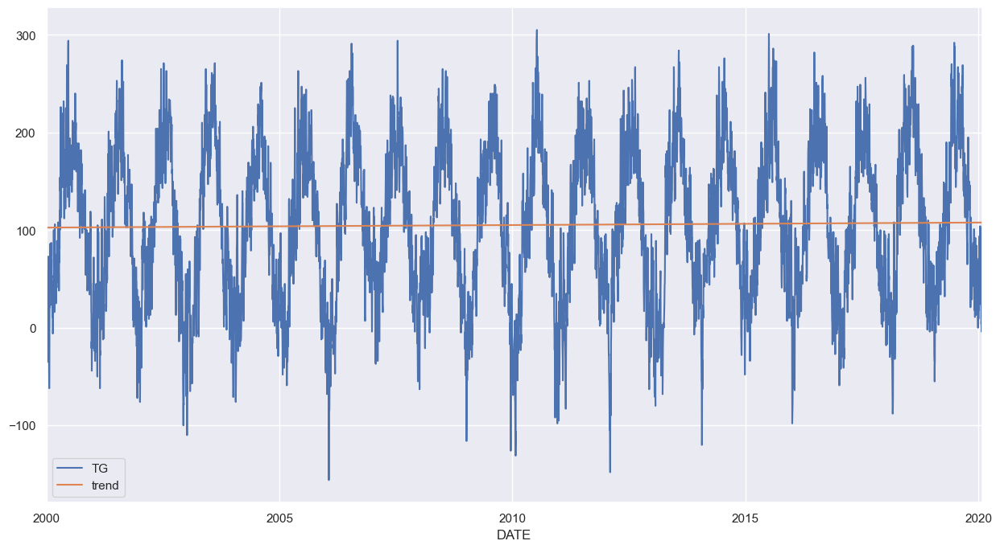

In [195]:
df_train[['TG', 'trend']]["2000-01-01":"2020-02-01"].plot()

In [196]:
fig = px.line(df_train, x=df_train.index, y=["TG","trend"], title="Daily temperature changes in Berlin")

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="3y", step="year", stepmode="backward"),
            dict(count=3, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

## Model the seasonality

In [198]:
df_train.head(5)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,trend
DATE,,,,,,,,,,,,,,,,,,,
1945-11-06,2759,27488,78,0,1945,11,0,0,0,0,0,0,0,0,0,0,1,0,88.704943
1945-11-07,2759,27488,68,0,1945,11,1,0,0,0,0,0,0,0,0,0,1,0,88.705646
1945-11-08,2759,27488,64,0,1945,11,2,0,0,0,0,0,0,0,0,0,1,0,88.706349
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,0,0,0,0,0,0,1,0,88.707052
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,0,0,0,0,0,0,1,0,88.707755


In [203]:
# Define X and y
X_train_trans = df_train.drop(columns=['TG', 'Year', 'Month', 'trend', 'Q_TG', 'STAID', 'SOUID'])  # thus keeping timestep and years', months', days' dummies

# y is already defined (the daily mean temperature)

In [204]:
X_train_trans.head(5)

,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
DATE,,,,,,,,,,,,
1945-11-06,0,0,0,0,0,0,0,0,0,0,1,0
1945-11-07,1,0,0,0,0,0,0,0,0,0,1,0
1945-11-08,2,0,0,0,0,0,0,0,0,0,1,0
1945-11-09,3,0,0,0,0,0,0,0,0,0,1,0
1945-11-10,4,0,0,0,0,0,0,0,0,0,1,0


In [205]:
m_trend_season=LinearRegression()

In [206]:
m_trend_season.fit(X_train_trans, y_train)
# Create a model with trend and seasonality
df_train['trend + seasonal'] = m_trend_season.predict(X_train_trans)
df_train.head()

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,trend,trend + seasonal
DATE,,,,,,,,,,,,,,,,,,,,
1945-11-06,2759,27488,78,0,1945,11,0,0,0,0,0,0,0,0,0,0,1,0,88.704943,41.857832
1945-11-07,2759,27488,68,0,1945,11,1,0,0,0,0,0,0,0,0,0,1,0,88.705646,41.858451
1945-11-08,2759,27488,64,0,1945,11,2,0,0,0,0,0,0,0,0,0,1,0,88.706349,41.859070
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,0,0,0,0,0,0,1,0,88.707052,41.859689
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,0,0,0,0,0,0,1,0,88.707755,41.860307


In [207]:
m_trend_season.predict(X_train_trans)
m_trend_season.score(X_train_trans, y_train)

0.7524985406780487

<AxesSubplot: xlabel='DATE'>

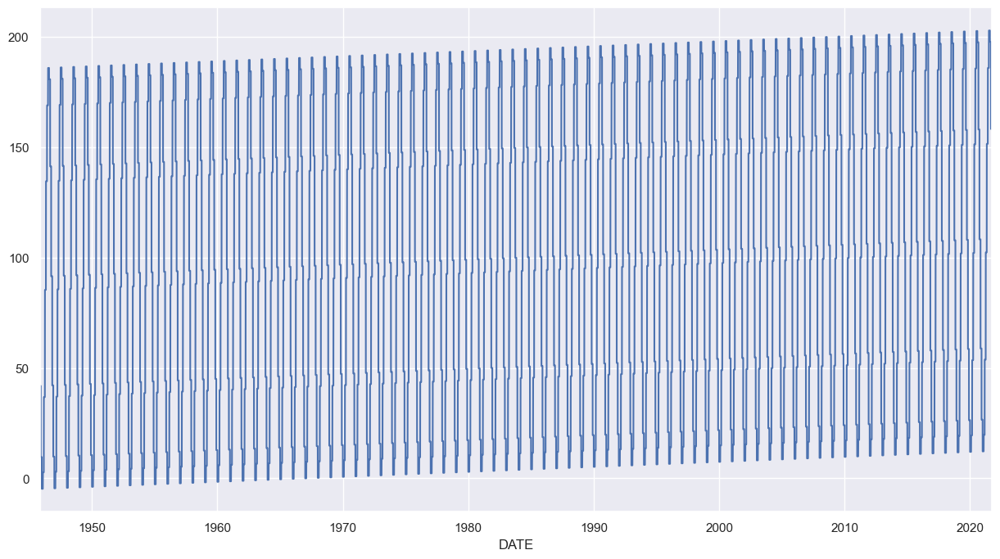

In [208]:
df_train['trend + seasonal'].plot()

<AxesSubplot: xlabel='DATE'>

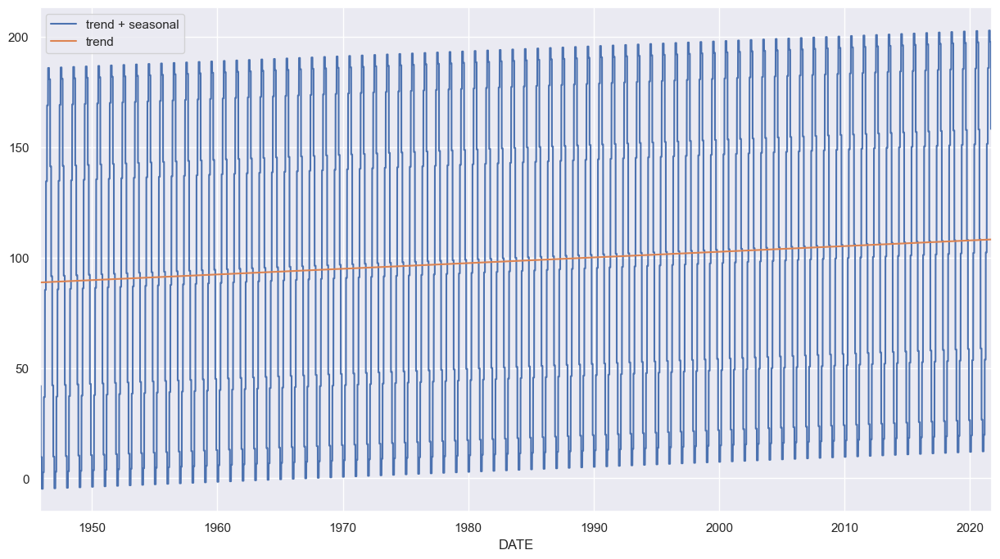

In [210]:
df_train[['trend + seasonal', 'trend']].plot()

<AxesSubplot: xlabel='DATE'>

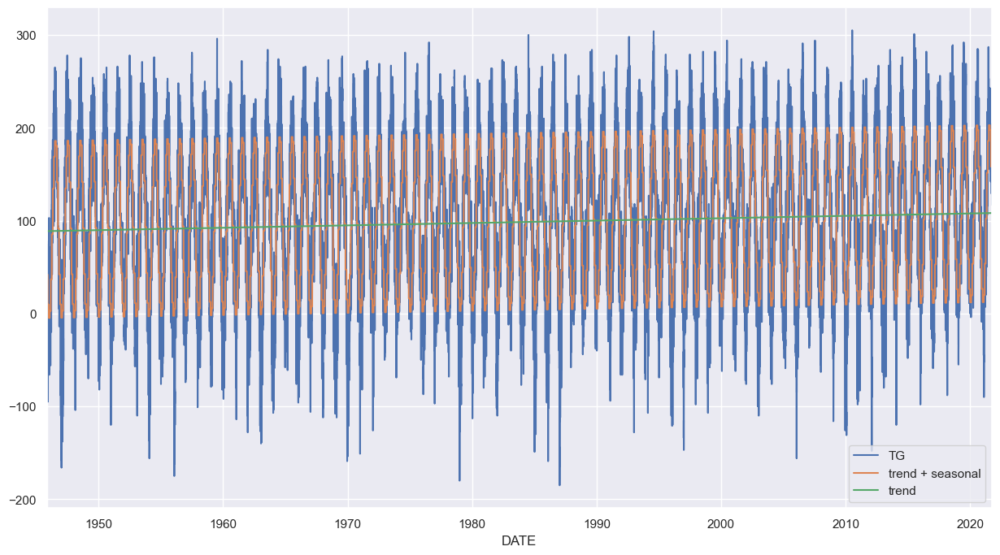

In [211]:
df_train[['TG', 'trend + seasonal', 'trend']].plot()

<AxesSubplot: xlabel='DATE'>

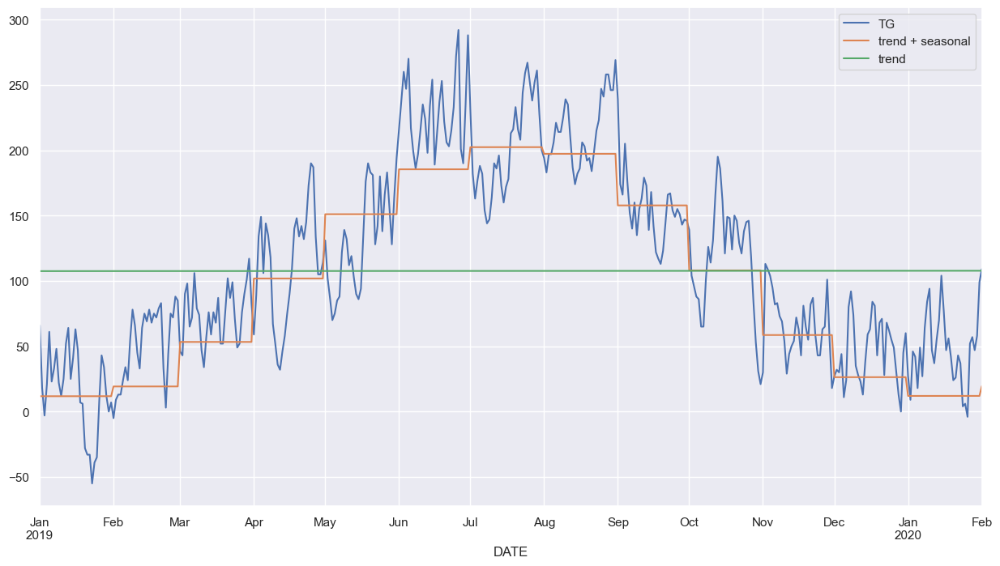

In [214]:
df_train[['TG', 'trend + seasonal', 'trend']]["2019-01-01":"2020-02-01"].plot()

## Extract Remainder

The final (third) component of time series that trend + seasonal is not able to explain. This is the component what we actually care about in Time Series Analysis.

In [218]:
df_train['remainder'] = df_train['TG'] - df_train['trend + seasonal']

In [220]:
df_train['remainder'].to_csv('temperature_remainder.csv')

<AxesSubplot: xlabel='DATE'>

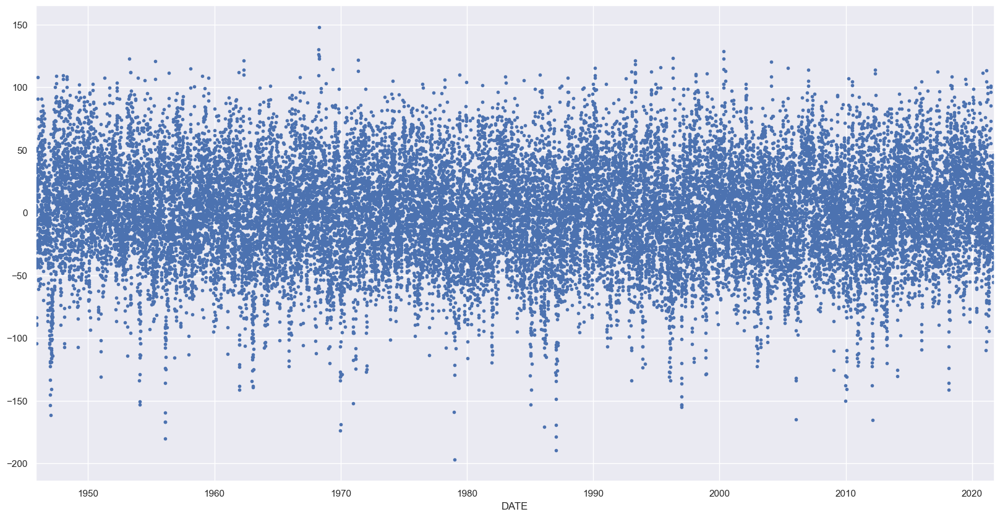

In [219]:
sns.set(rc = {'figure.figsize':(20,10)})
df_train['remainder'].plot(style='.')


## Autoregressive (AR) Model

Important: For AR and ARIMA models to work the time series needs to be stationary. A time series is stationary, if its variance does not change over time. 


### Create time lagged input feature 'lag1'

A lag is an interval of time between related phenomena. The two related phenomena in this case are the remainder today and the remainder tomorrow.

In [221]:
df_train['lag1'] = df_train['remainder'].shift(1)

### Inspect correlation between lag1 and remainder

In [222]:
round(df_train[["TG", "trend + seasonal", "remainder","lag1"]].corr(), 2)

,TG,trend + seasonal,remainder,lag1
TG,1.00,0.87,0.50,0.41
trend + seasonal,0.87,1.00,-0.00,0.01
remainder,0.50,-0.00,1.00,0.81
lag1,0.41,0.01,0.81,1.00


Intuitively: If it was warm yesterday, it is more likely to be warm today

<AxesSubplot:xlabel='lag1', ylabel='remainder'>

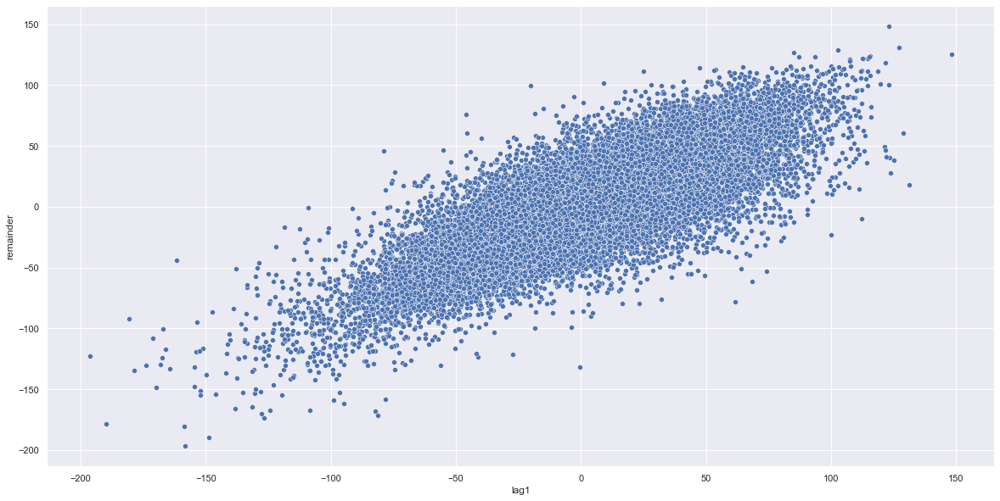

In [418]:
sns.scatterplot(x='lag1', y='remainder', data=tempelhof_train)


<AxesSubplot:xlabel='lag2', ylabel='remainder'>

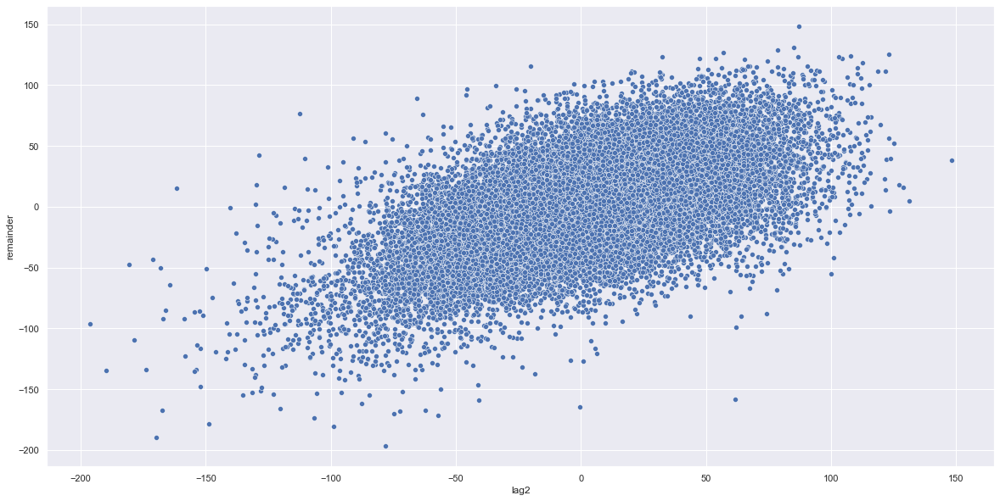

In [419]:
sns.scatterplot(x='lag2', y='remainder', data=tempelhof_train)

## Run an Autoregression (Linear Regression) of lag1 on the remainder

In [223]:
df_train[["TG", "trend + seasonal", "remainder","lag1"]].head(3)

,TG,trend + seasonal,remainder,lag1
DATE,,,,
1945-11-06,78,41.857832,36.142168,NaN
1945-11-07,68,41.858451,26.141549,36.142168
1945-11-08,64,41.859070,22.140930,26.141549


In [224]:
# Drop missing values
df_train.dropna(inplace = True)

In [225]:
# Assign X and y
X_train_lag1 = df_train[['lag1']]
y_train_lag1 = df_train['remainder']

In [226]:
# Create and fit the model
m_lag1 = LinearRegression()
m_lag1.fit(X_train_lag1, y_train_lag1 )

LinearRegression()

In [244]:
# Create predictions
df_train['predictions_ar1'] = m_lag1.predict(X_train_lag1)
df_train.head(10)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_8,Month_9,Month_10,Month_11,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1
DATE,,,,,,,,,,,,,,,,,,,,,
1945-11-07,2759,27488,68,0,1945,11,1,0,0,0,...,0,0,0,1,0,88.705646,41.858451,26.141549,36.142168,29.094195
1945-11-08,2759,27488,64,0,1945,11,2,0,0,0,...,0,0,0,1,0,88.706349,41.859070,22.140930,26.141549,21.043074
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,...,0,0,0,1,0,88.707052,41.859689,-1.859689,22.140930,17.822327
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,...,0,0,0,1,0,88.707755,41.860307,4.139693,-1.859689,-1.499666
1945-11-11,2759,27488,30,0,1945,11,5,0,0,0,...,0,0,0,1,0,88.708458,41.860926,-11.860926,4.139693,3.330209
1945-11-12,2759,27488,28,0,1945,11,6,0,0,0,...,0,0,0,1,0,88.709161,41.861545,-13.861545,-11.860926,-9.551285
1945-11-13,2759,27488,24,0,1945,11,7,0,0,0,...,0,0,0,1,0,88.709864,41.862163,-17.862163,-13.861545,-11.161908
1945-11-14,2759,27488,32,0,1945,11,8,0,0,0,...,0,0,0,1,0,88.710567,41.862782,-9.862782,-17.862163,-14.382655
1945-11-15,2759,27488,30,0,1945,11,9,0,0,0,...,0,0,0,1,0,88.711270,41.863401,-11.863401,-9.862782,-7.942655


<AxesSubplot: xlabel='DATE'>

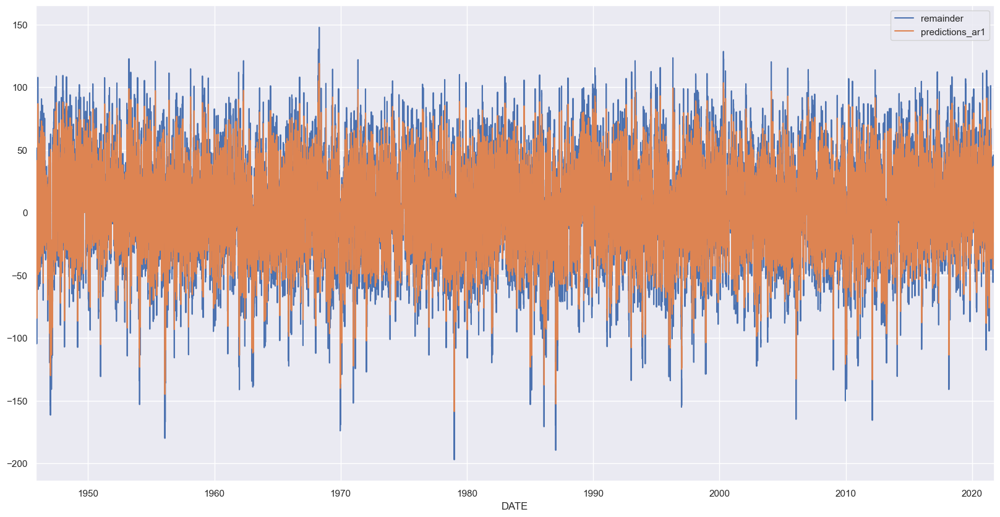

In [228]:
df_train[['remainder', 'predictions_ar1']].plot()

<AxesSubplot: xlabel='DATE'>

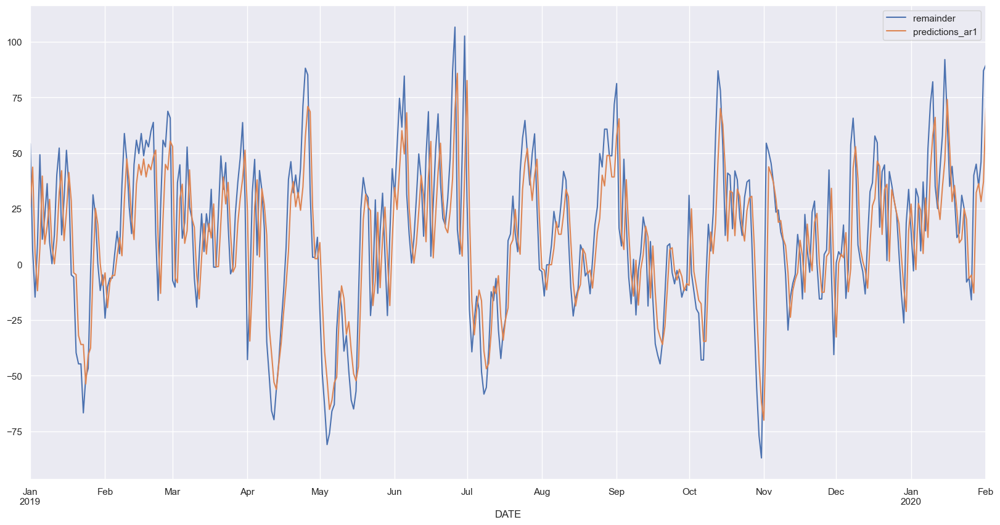

In [229]:
df_train[['remainder', 'predictions_ar1']]["2019-01-01":"2020-02-01"].plot()

<AxesSubplot: xlabel='DATE'>

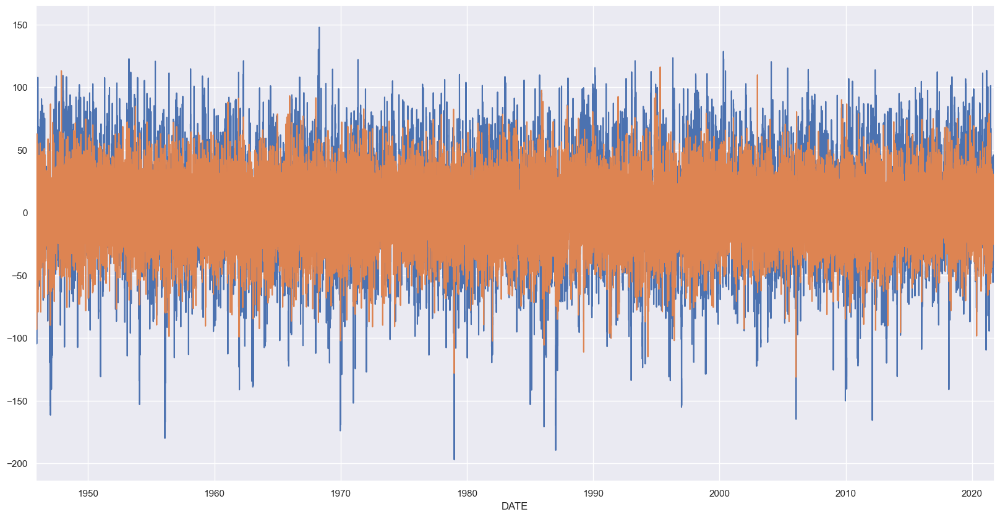

In [243]:
# Is the remainder prediction error smaller than the remainder itself?
df_train['remainder'].plot() 
(df_train['remainder'] - df_train['predictions_ar1']).plot()

<AxesSubplot: xlabel='DATE'>

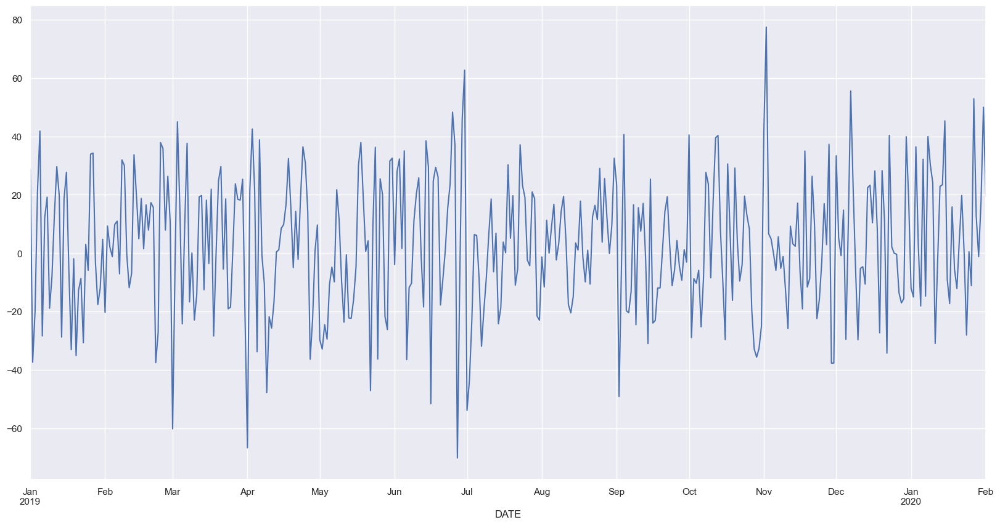

In [238]:
difference = df_train['remainder'] - df_train['predictions_ar1']
difference["2019-01-01":"2020-02-01"].plot()

## Sum of Absolute Errors (lag1)


In [240]:
sum(abs(number) for number in df_train['remainder'])/df_train.shape[0] # Sum of Absolute Errors (SAE) if we did not use AR

31.420106212432998

In [241]:
sum(abs(number) for number in df_train['remainder'] - df_train['predictions_ar1'])/df_train.shape[0] # SAE if we use AR

18.26358309692374

In [242]:
sum(abs(number) for number in df_train['remainder'] - df_train['lag1'])/df_train.shape[0]  # SAE if we use remainder of prev. t to predict t+1

18.930761465549974

## How many lags should be included to predict the remainder?

In order to select the model specification we want to look at the partial autocorrelation of the time series. The last lag before the partial autocorrelation plot cuts off is the number of lags that we might want to use as p value in our AR(P) model.


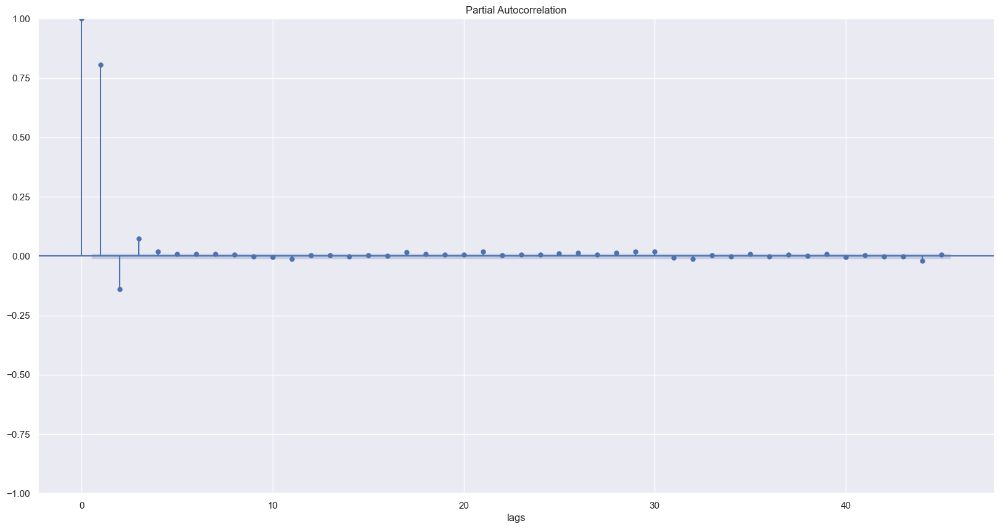

In [239]:
# Statsmodels provides a function called plot_pacf
# plot partial autocorrelation function
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_train['remainder'], method='ywm')
plt.xlabel('lags');

Box-Jenkins-Methodology:
This methodology makes a statement about how to choose lags.

We will choose all lags until the first sharp drop in values. In this case we should use 2 lag. This is the point after which we know the correlation dropped significantly.

Add the lag(s) of the remainder as a feature to your (temperature) DataFrame and create a new model with the features timestep, seasonal_dummies, lag1 of the remainder.

In [245]:
df_train['lag2'] = df_train['remainder'].shift(2)

In [246]:
df_train[["remainder","lag1", "lag2"]].head(3)

,remainder,lag1,lag2
DATE,,,
1945-11-07,26.141549,36.142168,NaN
1945-11-08,22.140930,26.141549,NaN
1945-11-09,-1.859689,22.140930,26.141549


In [247]:
# Drop missing values
df_train.dropna(inplace = True)

In [248]:
# Assign X and y
X_train_lag2 = df_train[['lag1', 'lag2']]
y_train_lag2 = df_train['remainder']

In [249]:
# Create and fit the model
m_lag2 = LinearRegression()
m_lag2.fit(X_train_lag2, y_train_lag2 )

LinearRegression()

In [250]:
# Create predictions
df_train['predictions_ar2'] = m_lag2.predict(X_train_lag2)
df_train.head()


,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_10,Month_11,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1,lag2,predictions_ar2
DATE,,,,,,,,,,,,,,,,,,,,,
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,...,0,1,0,88.707052,41.859689,-1.859689,22.140930,17.822327,26.141549,16.670918
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,...,0,1,0,88.707755,41.860307,4.139693,-1.859689,-1.499666,22.140930,-4.772836
1945-11-11,2759,27488,30,0,1945,11,5,0,0,0,...,0,1,0,88.708458,41.860926,-11.860926,4.139693,3.330209,-1.859689,4.049540
1945-11-12,2759,27488,28,0,1945,11,6,0,0,0,...,0,1,0,88.709161,41.861545,-13.861545,-11.860926,-9.551285,4.139693,-11.446630
1945-11-13,2759,27488,24,0,1945,11,7,0,0,0,...,0,1,0,88.709864,41.862163,-17.862163,-13.861545,-11.161908,-11.860926,-11.064506


In [251]:
round(df_train[["TG", "lag1", "lag2"]].corr(), 2)

,TG,lag1,lag2
TG,1.00,0.41,0.31
lag1,0.41,1.00,0.81
lag2,0.31,0.81,1.00


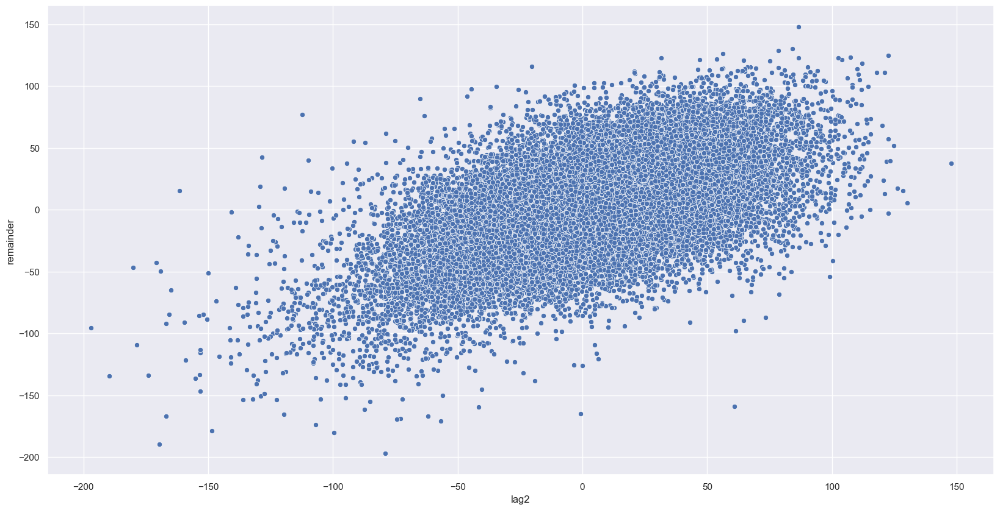

In [252]:
sns.scatterplot(x='lag2', y='remainder', data=df_train);

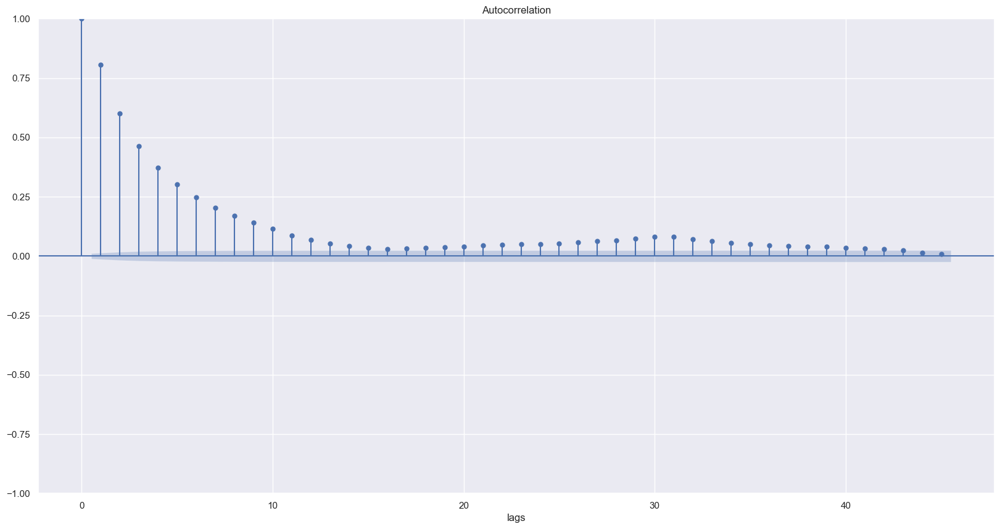

In [253]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df_train['remainder'])
plt.xlabel('lags');

## Sum of Absolute Errors (lag2)

In [255]:
df_train.head(3)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_10,Month_11,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1,lag2,predictions_ar2
DATE,,,,,,,,,,,,,,,,,,,,,
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,...,0,1,0,88.707052,41.859689,-1.859689,22.140930,17.822327,26.141549,16.670918
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,...,0,1,0,88.707755,41.860307,4.139693,-1.859689,-1.499666,22.140930,-4.772836
1945-11-11,2759,27488,30,0,1945,11,5,0,0,0,...,0,1,0,88.708458,41.860926,-11.860926,4.139693,3.330209,-1.859689,4.049540


In [254]:
sum(abs(number) for number in df_train['remainder'])/df_train.shape[0] # SAE if we did not use AR

31.420631383193562

In [256]:
sum(abs(number) for number in df_train['remainder'] - df_train['predictions_ar1'])/df_train.shape[0]  # SAE if we use remainder of prev. t to predict

18.264754693746987

In [258]:
sum(abs(number) for number in df_train['remainder'] - df_train['predictions_ar2'])/df_train.shape[0] # SAE if we use AR

18.046572855905634

In [259]:
y_train_final=df_train["TG"]

In [260]:
df_train.columns

Index(['STAID', 'SOUID', 'TG', 'Q_TG', 'Year', 'Month', 'Timestep', 'Month_2',
       'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7', 'Month_8',
       'Month_9', 'Month_10', 'Month_11', 'Month_12', 'trend',
       'trend + seasonal', 'remainder', 'lag1', 'predictions_ar1', 'lag2',
       'predictions_ar2'],
      dtype='object')

In [263]:
X_train_final = df_train.drop(['TG', 'Year', 'Month', 'trend', 'trend + seasonal', 'remainder',
                               'predictions_ar1', 'predictions_ar2'], axis=1)

In [264]:
X_train_final.shape

(27720, 17)

In [266]:
m_final=LinearRegression()
m_final.fit(X_train_final, y_train_final)
# Create a model with trend and seasonality
df_train['trend + seasonal+remainder'] = m_final.predict(X_train_final)
df_train.head()

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1,lag2,predictions_ar2,trend + seasonal+remeinder,trend + seasonal+remainder
DATE,,,,,,,,,,,,,,,,,,,,,
1945-11-09,2759,27488,40,0,1945,11,3,0,0,0,...,0,88.707052,41.859689,-1.859689,22.140930,17.822327,26.141549,16.670918,58.585494,58.585494
1945-11-10,2759,27488,46,0,1945,11,4,0,0,0,...,0,88.707755,41.860307,4.139693,-1.859689,-1.499666,22.140930,-4.772836,37.144215,37.144215
1945-11-11,2759,27488,30,0,1945,11,5,0,0,0,...,0,88.708458,41.860926,-11.860926,4.139693,3.330209,-1.859689,4.049540,45.961200,45.961200
1945-11-12,2759,27488,28,0,1945,11,6,0,0,0,...,0,88.709161,41.861545,-13.861545,-11.860926,-9.551285,4.139693,-11.446630,30.468809,30.468809
1945-11-13,2759,27488,24,0,1945,11,7,0,0,0,...,0,88.709864,41.862163,-17.862163,-13.861545,-11.161908,-11.860926,-11.064506,30.848230,30.848230


In [267]:
m_final.score(X_train_final,y_train_final)

0.914592287853738

<AxesSubplot: xlabel='DATE'>

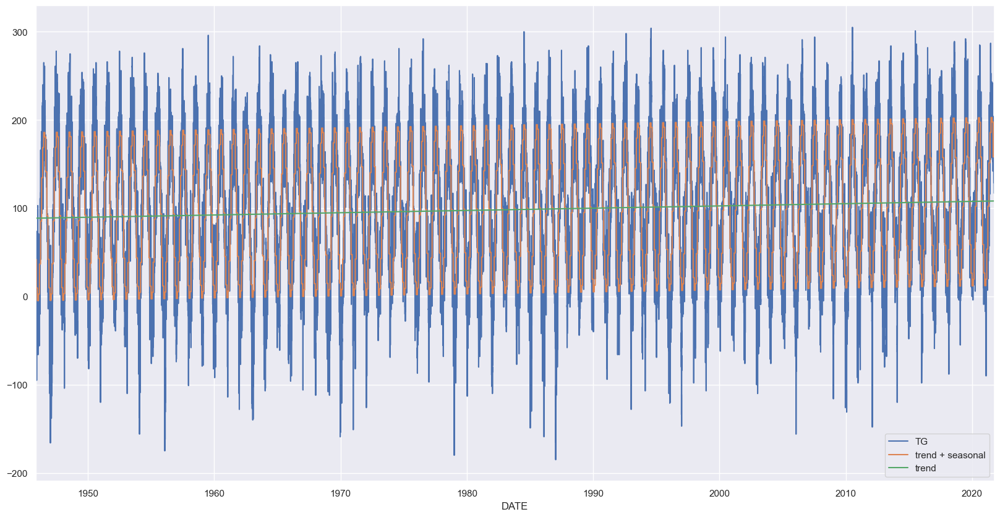

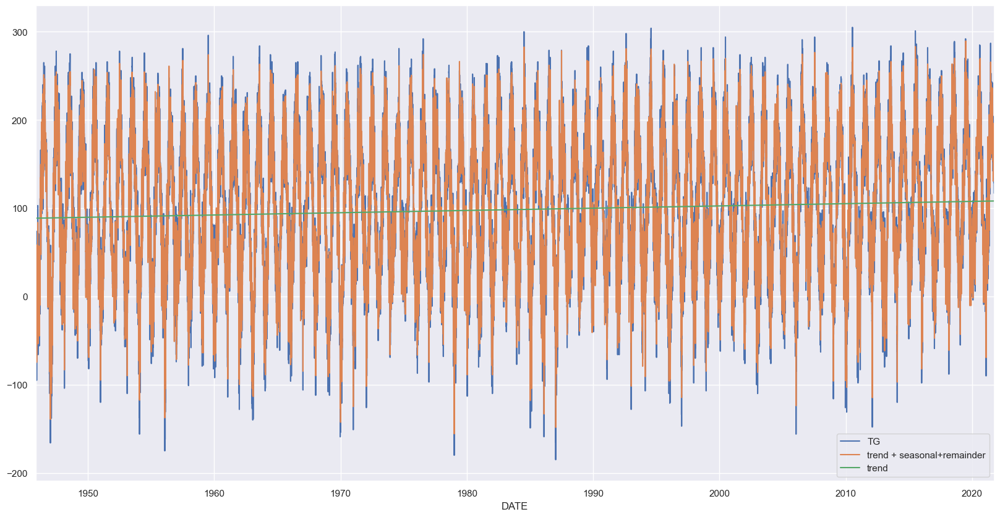

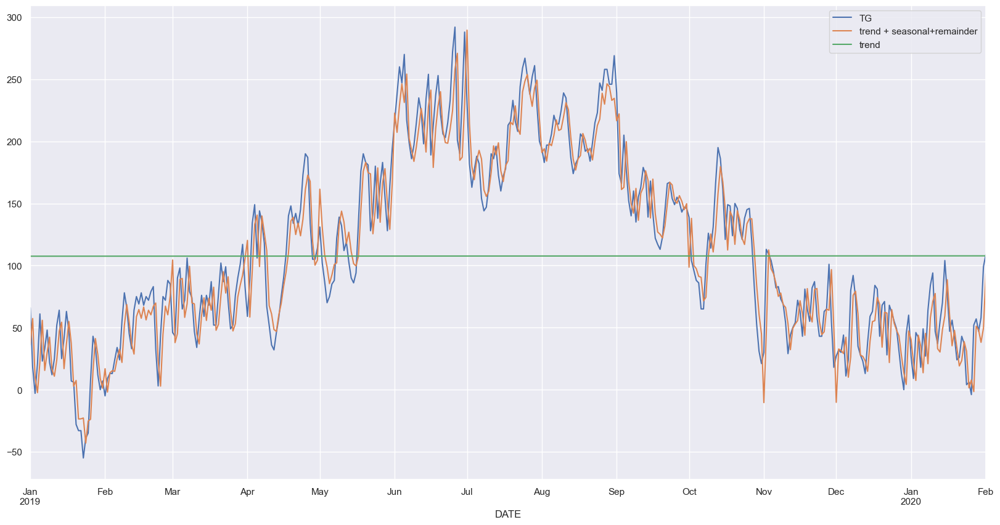

In [271]:
df_train[['TG', 'trend + seasonal', 'trend']].plot()
df_train[['TG', 'trend + seasonal+remainder', 'trend']].plot()
df_train[['TG', 'trend + seasonal+remainder', 'trend']]["2019-01-01":"2020-02-01"].plot()


## Model Evaluation

In [273]:
X_train_final.columns

Index(['STAID', 'SOUID', 'Q_TG', 'Timestep', 'Month_2', 'Month_3', 'Month_4',
       'Month_5', 'Month_6', 'Month_7', 'Month_8', 'Month_9', 'Month_10',
       'Month_11', 'Month_12', 'lag1', 'lag2'],
      dtype='object')

In [274]:
# Create a TimeSeriesSplit object
ts_split = TimeSeriesSplit(n_splits=5)

In [275]:
# Create the time series split
time_series_split = ts_split.split(X_train_final, y_train_final) 

In [276]:
# Do the cross validation: Remember these are the 'test scores' in the training data.
result = cross_val_score(estimator=m_final, 
                         X=X_train_final, y=y_train_final,
                         cv=time_series_split)
result

array([0.91284012, 0.90850283, 0.90444546, 0.91755826, 0.91983529])

In [277]:
result.mean()

0.9126363911476615

## Model Testing

In [278]:
df_test.head(5)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
DATE,,,,,,,,,,,,,,,,,,
2021-10-01,2759,11448,127,0,2021,10,27723,0,0,0,0,0,0,0,0,1,0,0
2021-10-02,2759,11448,148,0,2021,10,27724,0,0,0,0,0,0,0,0,1,0,0
2021-10-03,2759,11448,181,0,2021,10,27725,0,0,0,0,0,0,0,0,1,0,0
2021-10-04,2759,11448,148,0,2021,10,27726,0,0,0,0,0,0,0,0,1,0,0
2021-10-05,2759,11448,131,0,2021,10,27727,0,0,0,0,0,0,0,0,1,0,0


In [280]:
X_test = df_test[['Timestep']]

In [282]:
df_test['trend'] = m_trend.predict(X_test)

<AxesSubplot: xlabel='DATE'>

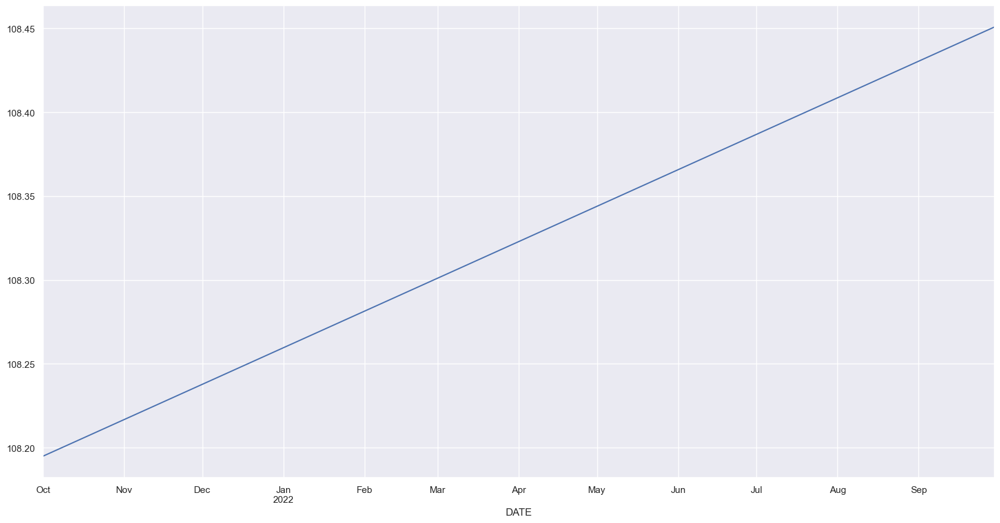

In [283]:
df_test['trend'].plot()

In [290]:
X_test.head(3)

,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
DATE,,,,,,,,,,,,
2021-10-01,27723,0,0,0,0,0,0,0,0,1,0,0
2021-10-02,27724,0,0,0,0,0,0,0,0,1,0,0
2021-10-03,27725,0,0,0,0,0,0,0,0,1,0,0


In [291]:
# Define X and y
X_test = df_test.drop(columns=['TG', 'Q_TG', 'SOUID', 'STAID', 'Year', 'Month', 'trend'])  # thus keeping timestep and years', months', days' dummies

# y is already defined (the daily mean temperature)

In [292]:
X_test.head(3)

,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
DATE,,,,,,,,,,,,
2021-10-01,27723,0,0,0,0,0,0,0,0,1,0,0
2021-10-02,27724,0,0,0,0,0,0,0,0,1,0,0
2021-10-03,27725,0,0,0,0,0,0,0,0,1,0,0


In [293]:
df_test['trend + seasonal'] = m_trend_season.predict(X_test)

In [295]:
m_trend_season.score(X_test, df_test["TG"])

0.7792738722687363

In [296]:
df_test.head(5)

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12,trend,trend + seasonal
DATE,,,,,,,,,,,,,,,,,,,,
2021-10-01,2759,11448,127,0,2021,10,27723,0,0,0,0,0,0,0,0,1,0,0,108.194941,108.462298
2021-10-02,2759,11448,148,0,2021,10,27724,0,0,0,0,0,0,0,0,1,0,0,108.195645,108.462916
2021-10-03,2759,11448,181,0,2021,10,27725,0,0,0,0,0,0,0,0,1,0,0,108.196348,108.463535
2021-10-04,2759,11448,148,0,2021,10,27726,0,0,0,0,0,0,0,0,1,0,0,108.197051,108.464154
2021-10-05,2759,11448,131,0,2021,10,27727,0,0,0,0,0,0,0,0,1,0,0,108.197754,108.464773


<AxesSubplot: xlabel='DATE'>

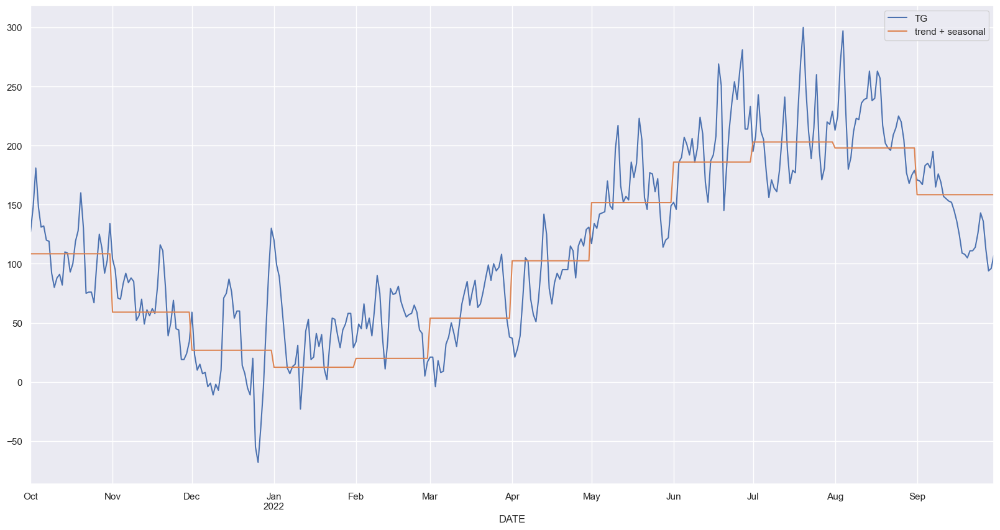

In [297]:
df_test[['TG', 'trend + seasonal']].plot()

Extract remainder from the test set

In [298]:
df_test['remainder'] = df_test['TG'] - df_test['trend + seasonal']

In [299]:
df_train['remainder'].head(5)

DATE
1945-11-09    -1.859689
1945-11-10     4.139693
1945-11-11   -11.860926
1945-11-12   -13.861545
1945-11-13   -17.862163
Name: remainder, dtype: float64

In [300]:
df_test.shape

(365, 21)

In [301]:
df_test["remainder"].std(), df_test["TG"].std()

(34.29648524643278, 74.68593562968955)

In [303]:
# Drop missing values
df_test.dropna(inplace = True)

In [304]:
df_test.shape

(364, 22)

In [302]:
df_test['lag1'] = df_test['remainder'].shift(1)

In [305]:
# Assign X and y
X_test_lag1 = df_test[['lag1']]
y_test_lag1 = df_test['remainder']

In [306]:
# Create predictions for the test data
df_test['predictions_ar1'] = m_lag1.predict(X_test_lag1)
df_test.head()

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_8,Month_9,Month_10,Month_11,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1
DATE,,,,,,,,,,,,,,,,,,,,,
2021-10-02,2759,11448,148,0,2021,10,27724,0,0,0,...,0,0,1,0,0,108.195645,108.462916,39.537084,18.537702,14.921504
2021-10-03,2759,11448,181,0,2021,10,27725,0,0,0,...,0,0,1,0,0,108.196348,108.463535,72.536465,39.537084,31.827314
2021-10-04,2759,11448,148,0,2021,10,27726,0,0,0,...,0,0,1,0,0,108.197051,108.464154,39.535846,72.536465,58.393871
2021-10-05,2759,11448,131,0,2021,10,27727,0,0,0,...,0,0,1,0,0,108.197754,108.464773,22.535227,39.535846,31.826318
2021-10-06,2759,11448,132,0,2021,10,27728,0,0,0,...,0,0,1,0,0,108.198457,108.465391,23.534609,22.535227,18.139761


In [307]:
df_test['lag2'] = df_test['remainder'].shift(2)

In [308]:
# Drop missing values
df_test.dropna(inplace = True)

In [309]:
# Assign X and y
X_test_lag2 = df_test[['lag1', 'lag2']]
y_test_lag2 = df_test['remainder']

In [310]:
# Create predictions
df_test['predictions_ar2'] = m_lag2.predict(X_test_lag2)
df_test.head()

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_10,Month_11,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1,lag2,predictions_ar2
DATE,,,,,,,,,,,,,,,,,,,,,
2021-10-04,2759,11448,148,0,2021,10,27726,0,0,0,...,1,0,0,108.197051,108.464154,39.535846,72.536465,58.393871,39.537084,61.005908
2021-10-05,2759,11448,131,0,2021,10,27727,0,0,0,...,1,0,0,108.197754,108.464773,22.535227,39.535846,31.826318,72.536465,26.189386
2021-10-06,2759,11448,132,0,2021,10,27728,0,0,0,...,1,0,0,108.198457,108.465391,23.534609,22.535227,18.139761,39.535846,15.177447
2021-10-07,2759,11448,120,0,2021,10,27729,0,0,0,...,1,0,0,108.199160,108.466010,11.533990,23.534609,18.944325,22.535227,18.447703
2021-10-08,2759,11448,119,0,2021,10,27730,0,0,0,...,1,0,0,108.199863,108.466629,10.533371,11.533990,9.283079,23.534609,7.310140


In [311]:
y_test_final = df_test["TG"]

In [312]:
X_test_final = df_test.drop(['TG', 'Year', 'Month', 'trend', 'trend + seasonal', 'remainder',
                               'predictions_ar1', 'predictions_ar2'], axis=1)

In [313]:
df_test['trend + seasonal+remeinder'] = m_final.predict(X_test_final)
df_test.head()

,STAID,SOUID,TG,Q_TG,Year,Month,Timestep,Month_2,Month_3,Month_4,...,Month_11,Month_12,trend,trend + seasonal,remainder,lag1,predictions_ar1,lag2,predictions_ar2,trend + seasonal+remeinder
DATE,,,,,,,,,,,,,,,,,,,,,
2021-10-04,2759,11448,148,0,2021,10,27726,0,0,0,...,0,0,108.197051,108.464154,39.535846,72.536465,58.393871,39.537084,61.005908,169.373539
2021-10-05,2759,11448,131,0,2021,10,27727,0,0,0,...,0,0,108.197754,108.464773,22.535227,39.535846,31.826318,72.536465,26.189386,134.568730
2021-10-06,2759,11448,132,0,2021,10,27728,0,0,0,...,0,0,108.198457,108.465391,23.534609,22.535227,18.139761,39.535846,15.177447,123.552033
2021-10-07,2759,11448,120,0,2021,10,27729,0,0,0,...,0,0,108.199160,108.466010,11.533990,23.534609,18.944325,22.535227,18.447703,126.819021
2021-10-08,2759,11448,119,0,2021,10,27730,0,0,0,...,0,0,108.199863,108.466629,10.533371,11.533990,9.283079,23.534609,7.310140,115.683671


In [314]:
m_final.score(X_test_final,y_test_final)

0.9165658309139185

<AxesSubplot: xlabel='DATE'>

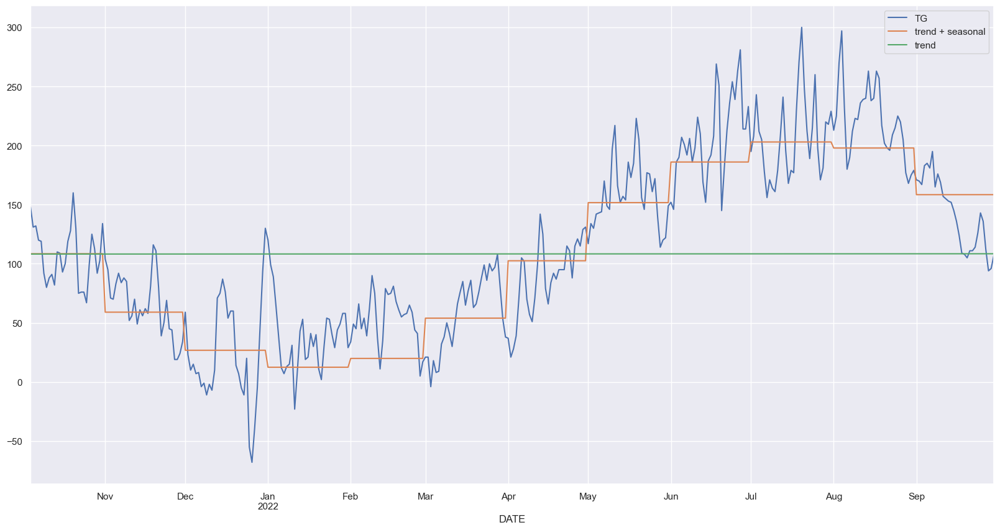

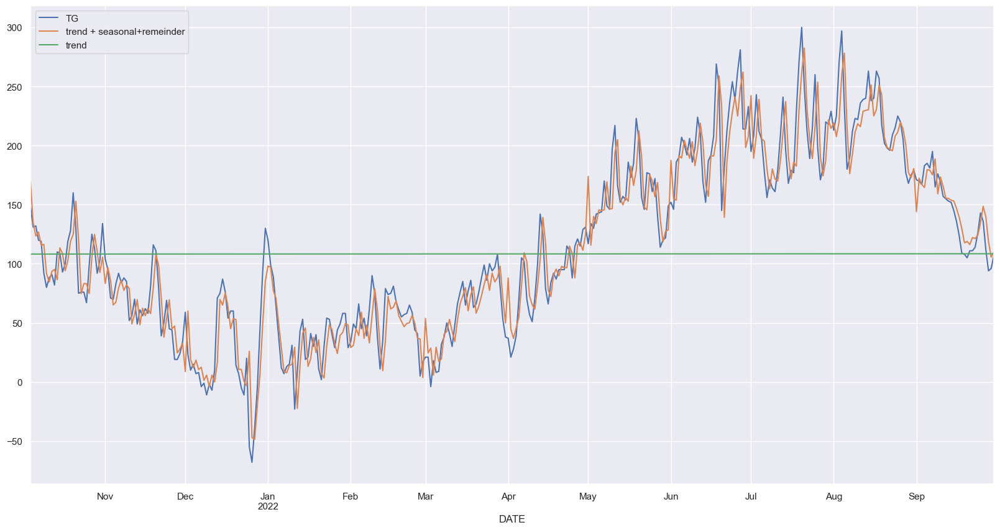

In [316]:
df_test[['TG', 'trend + seasonal', 'trend']].plot()
df_test[['TG', 'trend + seasonal+remeinder', 'trend']].plot()
